# HR Analytics Project- Understanding the Attrition in HR


Project Description

Every year a lot of companies hire a number of employees. The companies invest time and
money in training those employees, not just this but there are training programs within the
companies for their existing employees as well. The aim of these programs is to increase the
effectiveness of their employees. But where HR Analytics fit in this? and is it just about
improving the performance of employees?
HR Analytics

Human resource analytics (HR analytics) is an area in the field of analytics that refers to
applying analytic processes to the human resource department of an organization in the hope of
improving employee performance and therefore getting a better return on investment. HR
analytics does not just deal with gathering data on employee efficiency. Instead, it aims to
provide insight into each process by gathering data and then using it to make relevant
decisions about how to improve these processes.

Attrition in HR

Attrition in human resources refers to the gradual loss of employees overtime. In general,
relatively high attrition is problematic for companies. HR professionals often assume a
leadership role in designing company compensation programs, work culture, and motivation
systems that help the organization retain top employees.

How does Attrition affect companies? and how does HR Analytics help in analyzing attrition?
We will discuss the first question here and for the second question, we will write the code and
try to understand the process step by step.

Attrition affecting Companies

A major problem in high employee attrition is its cost to an organization. Job postings, hiring
processes, paperwork, and new hire training are some of the common expenses of losing
employees and replacing them. 

Additionally, regular employee turnover prohibits your
organization from increasing its collective knowledge base and experience over time. This is
especially concerning if your business is customer-facing, as customers often prefer to interact
with familiar people. Errors and issues are more likely if you constantly have new workers.

In [220]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import scipy
warnings.filterwarnings('ignore')

from sklearn.preprocessing import LabelEncoder
from imblearn import under_sampling, over_sampling
from imblearn.over_sampling import SMOTE


In [221]:
!pip install imbalanced-learn

In [403]:
#importing Train dataset

df=pd.read_csv(r'C:\Users\aisha\OneDrive\Desktop\WA_Fn-UseC_-HR-Employee-Attrition.csv')
df

,Age,Attrition,BusinessTravel,DailyRate,Department,DistanceFromHome,Education,EducationField,EmployeeCount,EmployeeNumber,...,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,41,Yes,Travel_Rarely,1102,Sales,1,2,Life Sciences,1,1,...,1,80,0,8,0,1,6,4,0,5
1,49,No,Travel_Frequently,279,Research & Development,8,1,Life Sciences,1,2,...,4,80,1,10,3,3,10,7,1,7
2,37,Yes,Travel_Rarely,1373,Research & Development,2,2,Other,1,4,...,2,80,0,7,3,3,0,0,0,0
3,33,No,Travel_Frequently,1392,Research & Development,3,4,Life Sciences,1,5,...,3,80,0,8,3,3,8,7,3,0
4,27,No,Travel_Rarely,591,Research & Development,2,1,Medical,1,7,...,4,80,1,6,3,3,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,23,2,Medical,1,2061,...,3,80,1,17,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,1,Medical,1,2062,...,1,80,1,9,5,3,7,7,1,7
1467,27,No,Travel_Rarely,155,Research & Development,4,3,Life Sciences,1,2064,...,2,80,1,6,0,3,6,2,0,3
1468,49,No,Travel_Frequently,1023,Sales,2,3,Medical,1,2065,...,4,80,0,17,3,2,9,6,0,8


# Exploratory Data Analysis

In [223]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

In [224]:
#checking the dimension of the dataset

df.shape

(1470, 35)

In [225]:
df.isnull().sum()

Age                         0
Attrition                   0
BusinessTravel              0
DailyRate                   0
Department                  0
DistanceFromHome            0
Education                   0
EducationField              0
EmployeeCount               0
EmployeeNumber              0
EnvironmentSatisfaction     0
Gender                      0
HourlyRate                  0
JobInvolvement              0
JobLevel                    0
JobRole                     0
JobSatisfaction             0
MaritalStatus               0
MonthlyIncome               0
MonthlyRate                 0
NumCompaniesWorked          0
Over18                      0
OverTime                    0
PercentSalaryHike           0
PerformanceRating           0
RelationshipSatisfaction    0
StandardHours               0
StockOptionLevel            0
TotalWorkingYears           0
TrainingTimesLastYear       0
WorkLifeBalance             0
YearsAtCompany              0
YearsInCurrentRole          0
YearsSince

In [226]:
df.columns.tolist()

['Age',
 'Attrition',
 'BusinessTravel',
 'DailyRate',
 'Department',
 'DistanceFromHome',
 'Education',
 'EducationField',
 'EmployeeCount',
 'EmployeeNumber',
 'EnvironmentSatisfaction',
 'Gender',
 'HourlyRate',
 'JobInvolvement',
 'JobLevel',
 'JobRole',
 'JobSatisfaction',
 'MaritalStatus',
 'MonthlyIncome',
 'MonthlyRate',
 'NumCompaniesWorked',
 'Over18',
 'OverTime',
 'PercentSalaryHike',
 'PerformanceRating',
 'RelationshipSatisfaction',
 'StandardHours',
 'StockOptionLevel',
 'TotalWorkingYears',
 'TrainingTimesLastYear',
 'WorkLifeBalance',
 'YearsAtCompany',
 'YearsInCurrentRole',
 'YearsSinceLastPromotion',
 'YearsWithCurrManager']

<AxesSubplot:>

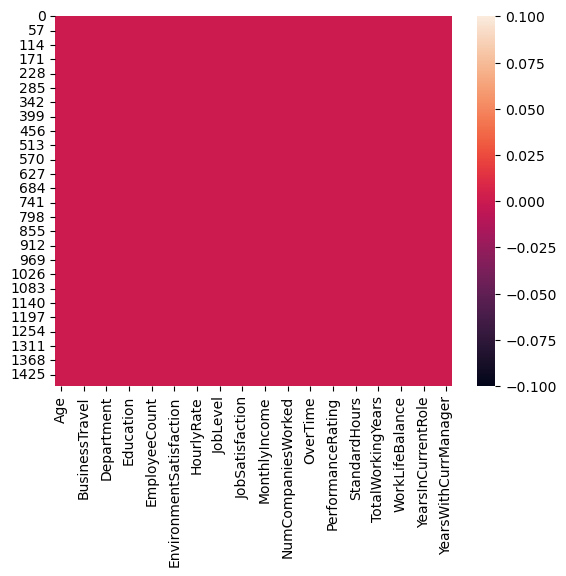

In [227]:
#lets visualize it using heatmap
sns.heatmap(df.isnull())

In [404]:
df=df.drop('EmployeeCount',axis=1)


# Data Visualization 


In [405]:
#Seperating Numerical and Categorical columns

#checking for categorical columns

categorical_col = []
for i in df.dtypes.index:
    if df.dtypes[i]=="object":
        categorical_col.append(i)
print("categorical Columns:",categorical_col)

#checking for numerical columns

numerical_col = []
for i in df.dtypes.index:
    if df.dtypes[i]!="object":
        numerical_col.append(i)
print("Numerical Columns:",numerical_col)


categorical Columns: ['Attrition', 'BusinessTravel', 'Department', 'EducationField', 'Gender', 'JobRole', 'MaritalStatus', 'Over18', 'OverTime']
Numerical Columns: ['Age', 'DailyRate', 'DistanceFromHome', 'Education', 'EmployeeNumber', 'EnvironmentSatisfaction', 'HourlyRate', 'JobInvolvement', 'JobLevel', 'JobSatisfaction', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel', 'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion', 'YearsWithCurrManager']


# Univariate Analysis


No     1233
Yes     237
Name: Attrition, dtype: int64


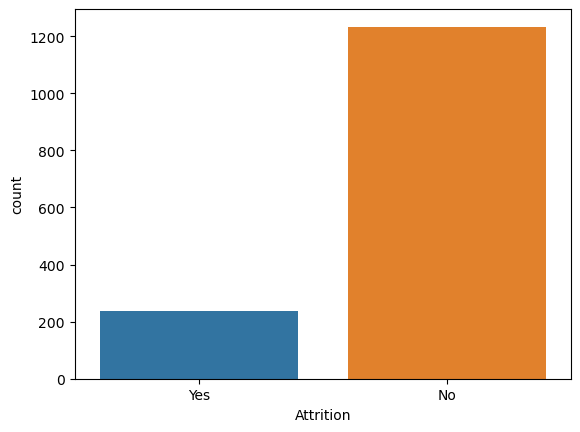

In [230]:
#visualize the number of types of glass column

ax=sns.countplot(x= 'Attrition',data=df)
print(df['Attrition'].value_counts())


Male      882
Female    588
Name: Gender, dtype: int64


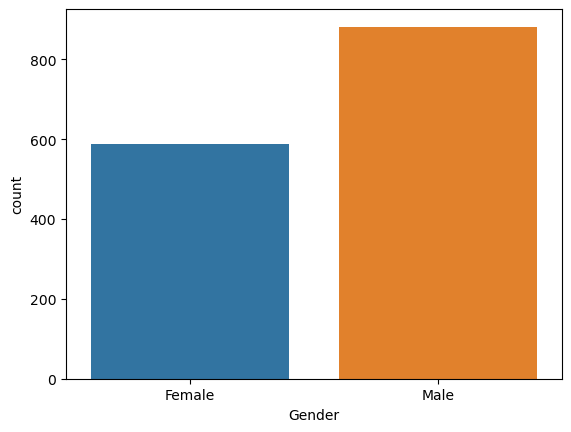

In [231]:
#visualize the number of Males and Females in Attrition count

ax=sns.countplot(x= 'Gender',data=df)
print(df['Gender'].value_counts())


Research & Development    961
Sales                     446
Human Resources            63
Name: Department, dtype: int64


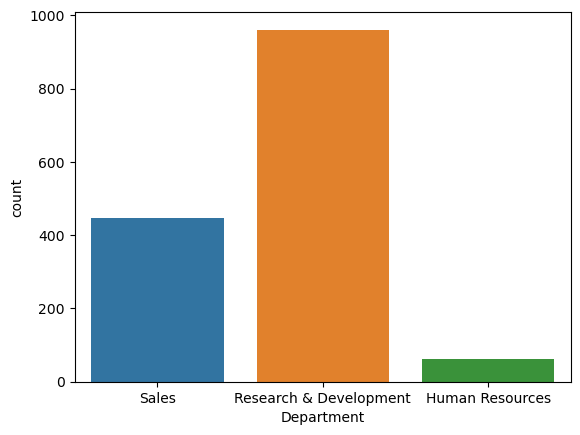

In [232]:
#Visualize the count of department

ax=sns.countplot(x= 'Department',data=df)
print(df['Department'].value_counts())

Travel_Rarely        1043
Travel_Frequently     277
Non-Travel            150
Name: BusinessTravel, dtype: int64


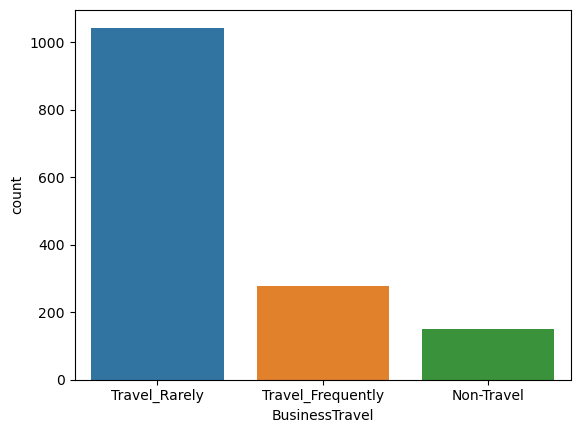

In [233]:
#Visualize the count of Business travel

ax=sns.countplot(x= 'BusinessTravel',data=df)
print(df['BusinessTravel'].value_counts())

# Bivariate Analysis


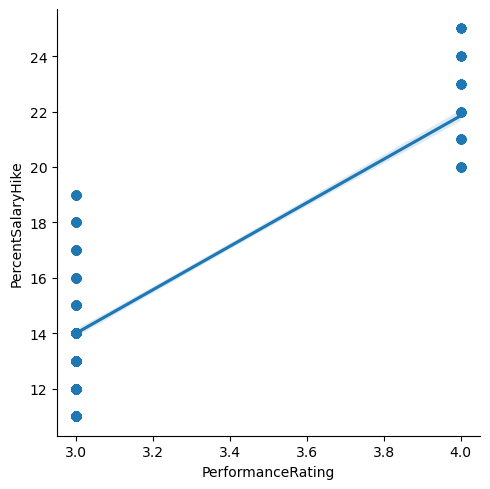

In [234]:
#Checking relation between Performance rating and percent salary hike 

sns.lmplot(y='PercentSalaryHike',x='PerformanceRating',data=df,palette='colorblind')

In [251]:
#Encoding categorical columns using Ordinal Encoder
from sklearn.preprocessing import OrdinalEncoder

OE = OrdinalEncoder()

df['Attrition']=OE.fit_transform(df['Attrition'].values.reshape(-1,1))
df['Gender']=OE.fit_transform(df['Gender'].values.reshape(-1,1))
df['BusinessTravel']=OE.fit_transform(df['BusinessTravel'].values.reshape(-1,1))


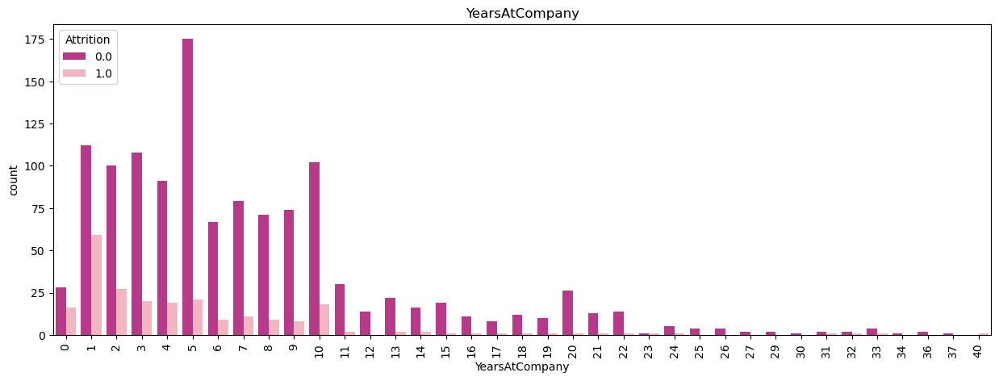

In [236]:
#Visualize the count of YearsAtCompany'

plt.figure(figsize=(15,5))
sns.countplot(df["YearsAtCompany"],palette="RdPu_r",hue=df['Attrition'])
plt.title("YearsAtCompany")
plt.xticks(rotation=90)
plt.show()


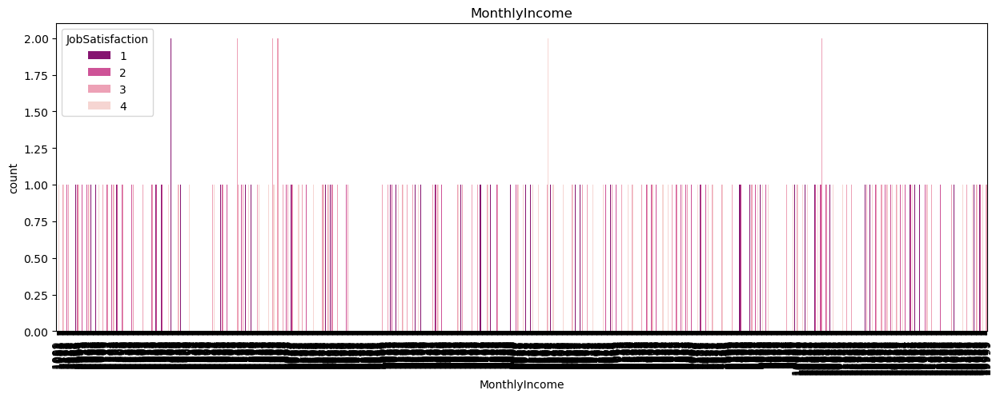

In [237]:
#Visualize the count of YearsAtCompany'

plt.figure(figsize=(15,5))
sns.countplot(df["MonthlyIncome"],palette="RdPu_r",hue=df['JobSatisfaction'])
plt.title("MonthlyIncome")
plt.xticks(rotation=90)
plt.show()


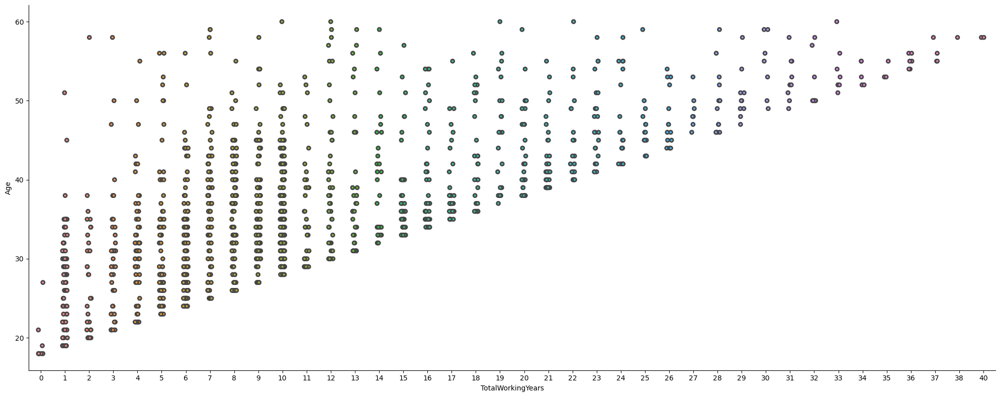

In [238]:
# Relationship between Age and Gender

sns.catplot(x = "TotalWorkingYears", y = "Age", kind="strip",data=df,height=8, linewidth=2, aspect=2.5)

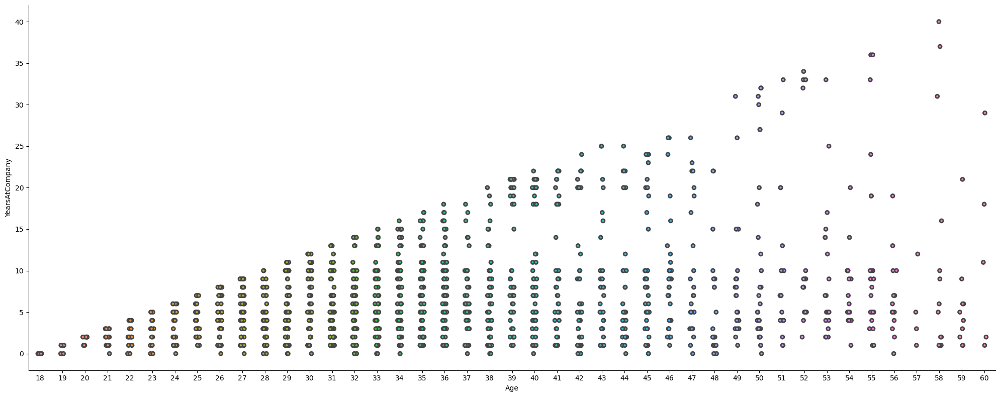

In [239]:
sns.catplot(x = "Age", y = "YearsAtCompany", kind="strip",data=df,height=8, linewidth=2, aspect=2.5)

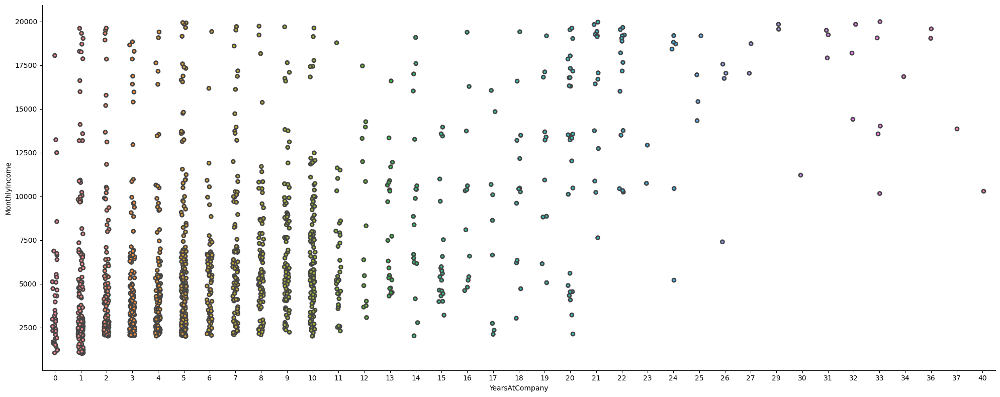

In [240]:
sns.catplot(x = "YearsAtCompany", y = "MonthlyIncome", kind="strip",data=df,height=8, linewidth=2, aspect=2.5)

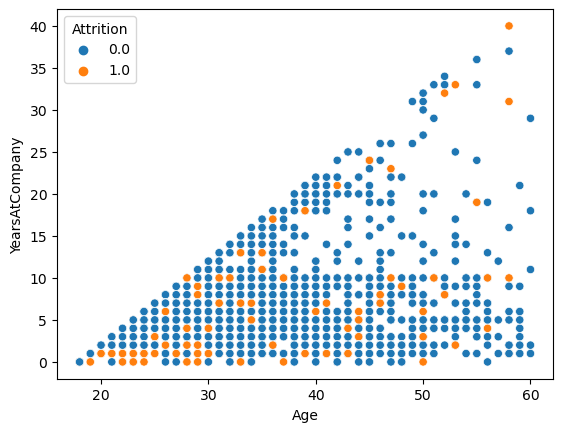

In [241]:
# attrition as hue and age vs gender

sns.scatterplot(x = "Age", y = "YearsAtCompany",hue='Attrition',data=df)
plt.show()

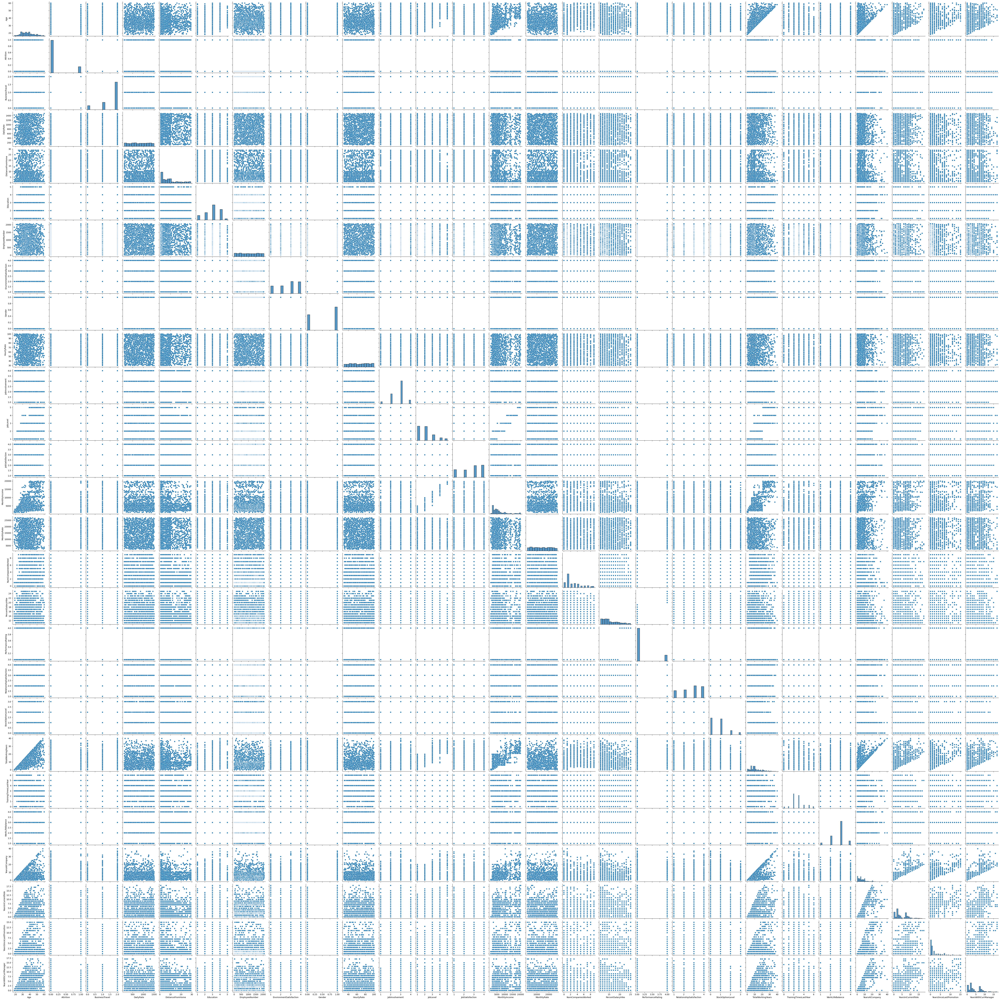

In [242]:
sns.pairplot(df)

After looking at the correlation and the graph, it shows the strong correlation of Age with Totalworkingyears, YearsAtcompany with Totalworkingyears and YearsInCurrentRole with yearsatcompany

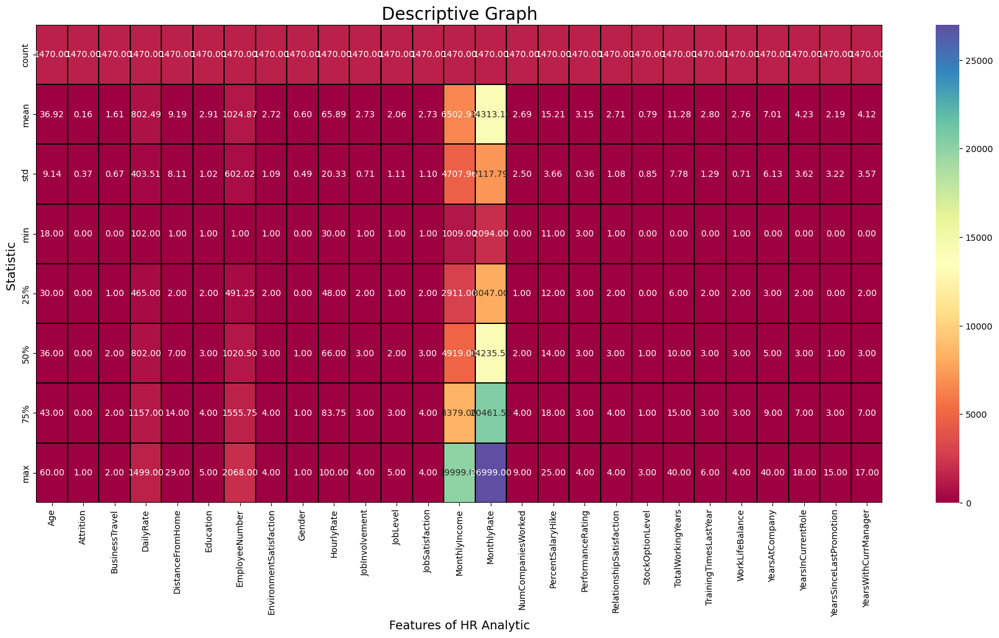

In [243]:
#Descriptive Graph of features and target variable of the team 

plt.figure(figsize=(22,10))
sns.heatmap(df.describe(),annot=True,fmt='0.2f',linewidth=0.2,linecolor='black',cmap='Spectral')
plt.xlabel('Features of HR Analytic',fontsize=14)
plt.ylabel('Statistic ',fontsize=14)
plt.title("Descriptive Graph",fontsize=20)
plt.show()



This gives the statistical information of the numerical columns.

From the above description we can observe the following:

The counts of all the columns are same which means there are no missing values in the data set.

The mean value is higher than the median(50%) in most of the column which means the data is skewed to right in this column.

By summarizing the data we can observe there is a huge differences between 75% and max hence there are outliers present in the data

We can also notice the Standard deviation, min 25% values from the described method.

 ## Correlation between target variable and independent variables

In [244]:
df.corr().T

,Age,Attrition,BusinessTravel,DailyRate,DistanceFromHome,Education,EmployeeNumber,EnvironmentSatisfaction,Gender,HourlyRate,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
Age,1.000000,-0.159205,0.024751,0.010661,-0.001686,0.208034,-0.010145,0.010146,-0.036311,0.024287,...,0.001904,0.053535,0.037510,0.680381,-0.019621,-0.021490,0.311309,0.212901,0.216513,0.202089
Attrition,-0.159205,1.000000,0.000074,-0.056652,0.077924,-0.031373,-0.010577,-0.103369,0.029453,-0.006846,...,0.002889,-0.045872,-0.137145,-0.171063,-0.059478,-0.063939,-0.134392,-0.160545,-0.033019,-0.156199
BusinessTravel,0.024751,0.000074,1.000000,-0.004086,-0.024469,0.000757,-0.015578,0.004174,-0.032981,0.026528,...,-0.026341,-0.035986,-0.016727,0.034226,0.015240,-0.011256,-0.014575,-0.011497,-0.032591,-0.022636
DailyRate,0.010661,-0.056652,-0.004086,1.000000,-0.004985,-0.016806,-0.050990,0.018355,-0.011716,0.023381,...,0.000473,0.007846,0.042143,0.014515,0.002453,-0.037848,-0.034055,0.009932,-0.033229,-0.026363
DistanceFromHome,-0.001686,0.077924,-0.024469,-0.004985,1.000000,0.021042,0.032916,-0.016075,-0.001851,0.031131,...,0.027110,0.006557,0.044872,0.004628,-0.036942,-0.026556,0.009508,0.018845,0.010029,0.014406
Education,0.208034,-0.031373,0.000757,-0.016806,0.021042,1.000000,0.042070,-0.027128,-0.016547,0.016775,...,-0.024539,-0.009118,0.018422,0.148280,-0.025100,0.009819,0.069114,0.060236,0.054254,0.069065
EmployeeNumber,-0.010145,-0.010577,-0.015578,-0.050990,0.032916,0.042070,1.000000,0.017621,0.022556,0.035179,...,-0.020359,-0.069861,0.062227,-0.014365,0.023603,0.010309,-0.011240,-0.008416,-0.009019,-0.009197
EnvironmentSatisfaction,0.010146,-0.103369,0.004174,0.018355,-0.016075,-0.027128,0.017621,1.000000,0.000508,-0.049857,...,-0.029548,0.007665,0.003432,-0.002693,-0.019359,0.027627,0.001458,0.018007,0.016194,-0.004999
Gender,-0.036311,0.029453,-0.032981,-0.011716,-0.001851,-0.016547,0.022556,0.000508,1.000000,-0.000478,...,-0.013859,0.022868,0.012716,-0.046881,-0.038787,-0.002753,-0.029747,-0.041483,-0.026985,-0.030599
HourlyRate,0.024287,-0.006846,0.026528,0.023381,0.031131,0.016775,0.035179,-0.049857,-0.000478,1.000000,...,-0.002172,0.001330,0.050263,-0.002334,-0.008548,-0.004607,-0.019582,-0.024106,-0.026716,-0.020123


Looking at the relation, Attrition has low relation with Education and hourly rate


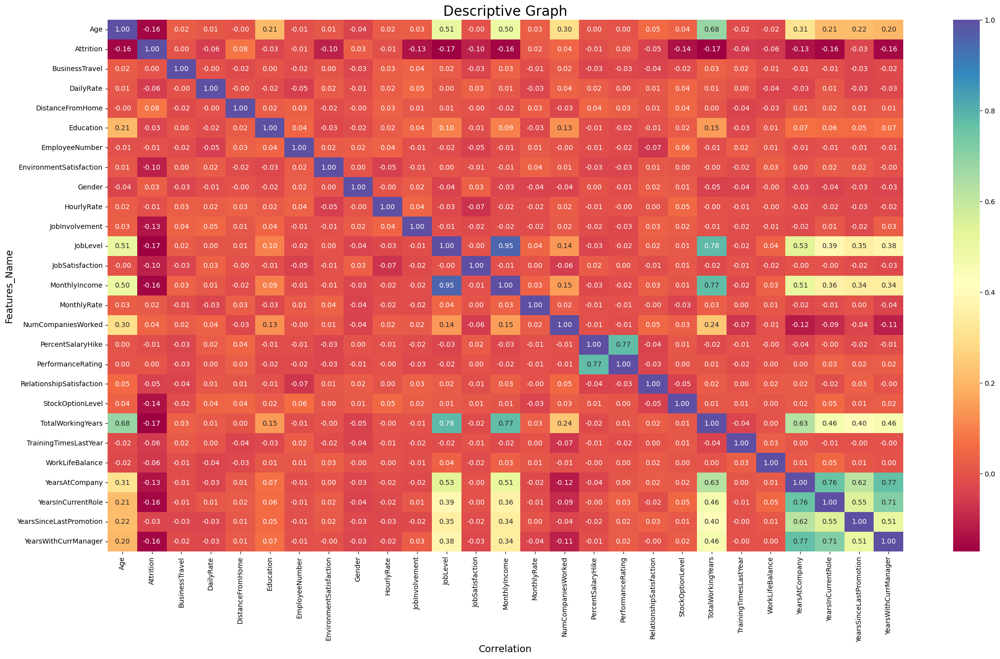

In [245]:
plt.figure(figsize=(26,14))
sns.heatmap(df.corr(),annot =True, fmt ='0.2f',linecolor='black',cmap='Spectral')
plt.xlabel('Correlation',fontsize=14)
plt.ylabel('Features_Name',fontsize=14)
plt.title('Descriptive Graph',fontsize=20)
plt.show()

Looking at the graph, we see the strong correlation of Attrition (Target Variable) with Age, JobInvolvement, JobLevel,MonthlyIncome,StockoptionLevel, TotalWorkingYears,YearsatCompany, YearsatCurrentRole, YearsatCurrentManager.

We also see strong correlation, Totalworkingyears with Age, JobLevel with TotalWorkingYears, MonthlyIncome with Totalworkingyears, Performancerating with percentsalaryhike, Totalworkingyears with MonthlyIncome, Yearsatcompany with yearswithcurrentManager.

# # Visualizing the correlation between label and features using bar plot

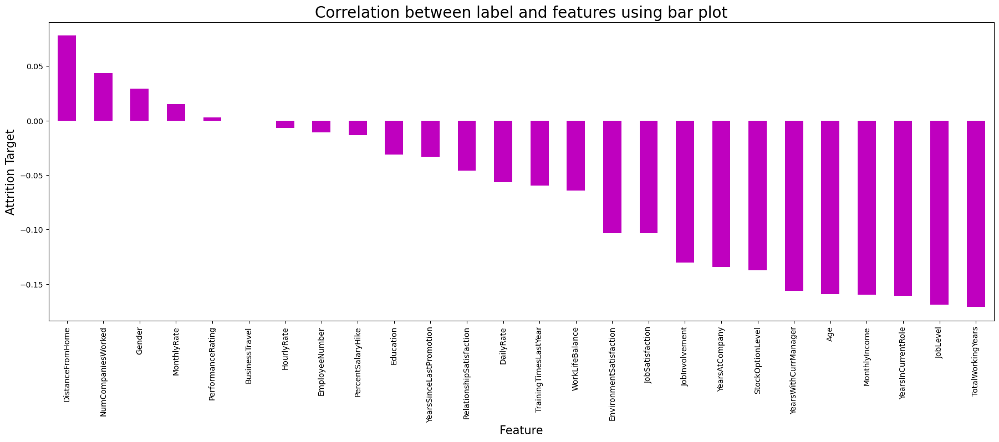

In [246]:
plt.figure(figsize = (22,7))
df.corr()['Attrition'].sort_values(ascending = False).drop(['Attrition']).plot(kind='bar',color="m")
plt.xlabel('Feature',fontsize = 15)
plt.ylabel('Attrition Target',fontsize = 15)
plt.title("Correlation between label and features using bar plot",fontsize=20)                                                        
plt.show()

Highest negative correlation shows:

1.TotalWorkingYears
2.JobLevel
3.YearsAtCurrentRole
4.MonthlyIncome
5.Age
6.YearsWithCurrManager
7.StockOptionLevel
8.YearsAtCompany
9.JobInvolvement
10.JobSatisfaction
11.EnvironmentSatisfaction

Highest positive correlation:
1.Distance from home
2.NumCompanyWorked
3.Gender
4.MonthlyRate



# Checking how the data has been distributed in each column


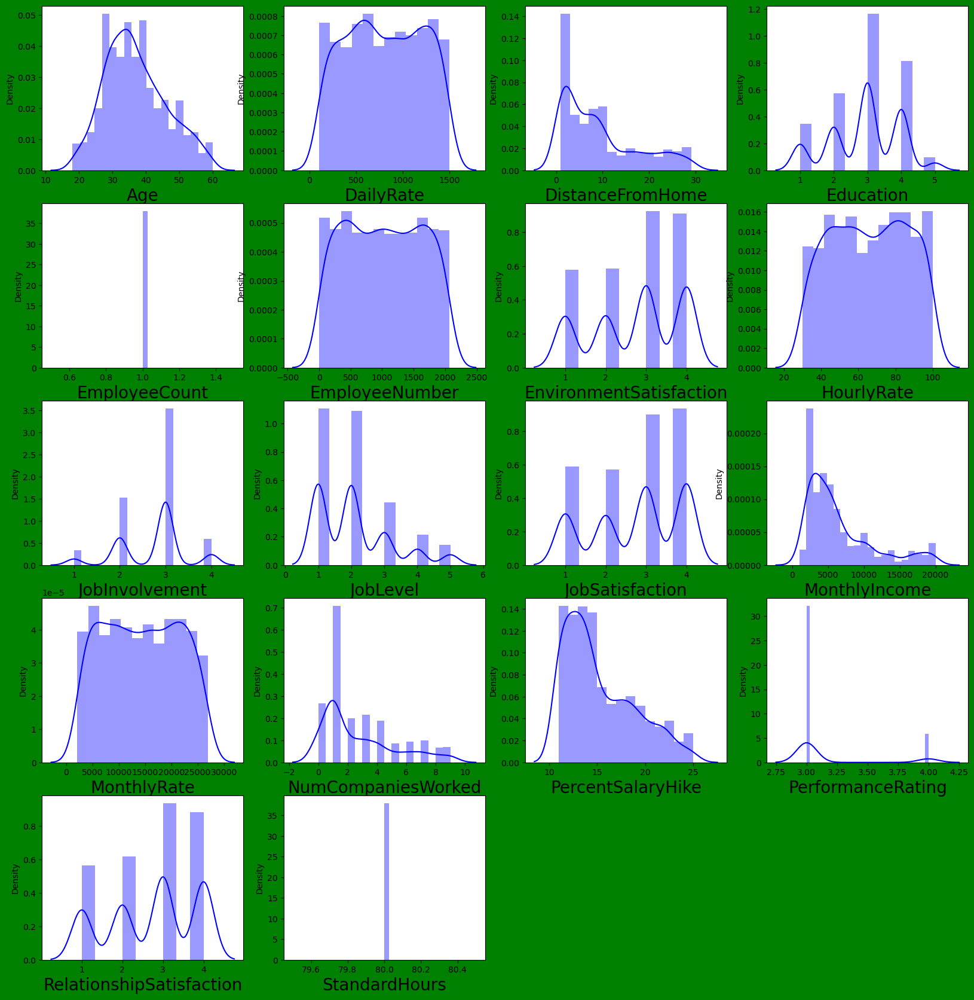

In [252]:
plt.figure(figsize=(20,25),facecolor="green")
plotnumber = 1

for column in numerical_col:
    if plotnumber <= 18:
        ax = plt.subplot(6,4,plotnumber)
        sns.distplot(df[column],color='b')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()    
        

# ## Checking for Outlier

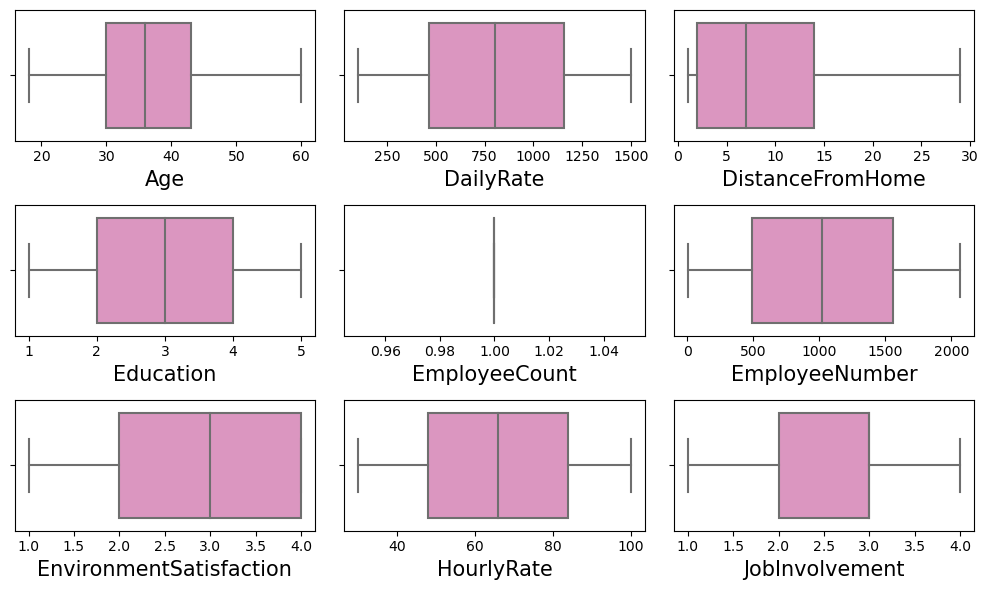

In [253]:
#lets check the outliers by plotting boxplot of categorical column

plt.figure(figsize = (10,6), facecolor ="white")
plotnumber = 1 
for col in numerical_col:
    if plotnumber<=9:
        ax = plt.subplot(3,3,plotnumber)
        sns.boxplot(df[col],palette = "Set2_r")
        plt.xlabel(col, fontsize = 15)
        plt.yticks(rotation = 0, fontsize = 10)
    plotnumber+=1
plt.tight_layout()


In [254]:

from scipy.stats import zscore

out_features=df[['Age','DistanceFromHome','Education','EnvironmentSatisfaction','HourlyRate','JobInvolvement','JobLevel']]
z=np.abs(zscore(out_features))
z

,Age,DistanceFromHome,Education,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel
0,0.446350,1.010909,0.891688,0.660531,1.383138,0.379672,0.057788
1,1.322365,0.147150,1.868426,0.254625,0.240677,1.026167,0.057788
2,0.008343,0.887515,0.891688,1.169781,1.284725,1.026167,0.961486
3,0.429664,0.764121,1.061787,1.169781,0.486709,0.379672,0.961486
4,1.086676,0.887515,1.868426,1.575686,1.274014,0.379672,0.961486
...,...,...,...,...,...,...,...
1465,0.101159,1.703764,0.891688,0.254625,1.224807,1.785511,0.057788
1466,0.227347,0.393938,1.868426,1.169781,1.175601,1.026167,0.845911
1467,1.086676,0.640727,0.085049,0.660531,1.038693,1.785511,0.057788
1468,1.322365,0.887515,0.085049,1.169781,0.142264,1.026167,0.057788


In [255]:
#threshold =3
np.where(z>3)

(array([], dtype=int64), array([], dtype=int64))

In [256]:
df1=df[(z<3).all(axis=1)]
df1.shape

(1470, 35)

In [257]:
#shape of old and new dataframe

print("old data frame",df.shape[0])
print("new data frame",df1.shape[0])

old data frame 1470
new data frame 1470


In [258]:
print("Data loss percentage",((df.shape[0]-df1.shape[0])/df.shape[0])*100)

Data loss percentage 0.0


In [316]:
df1.shape

(1470, 35)

In [329]:
#Encoding categorical columns using Ordinal Encoder

from sklearn.preprocessing import OrdinalEncoder

OE = OrdinalEncoder()
for i in df2.columns:
    if df2[i].dtypes != 'float':
        df2[i]= OE.fit_transform(df2[i].values.reshape(-1,1))
df2

,Age,Attrition,BusinessTravel,DailyRate,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,23.0,1.0,2.0,624.0,0.0,1.0,1.0,0.0,1.0,0.0,...,1.442250,0.0,0.0,1.259921,0.0,0.0,1.817121,4.0,0.000000,5.0
1,31.0,0.0,1.0,113.0,7.0,0.0,1.0,0.0,2.0,1.0,...,1.587401,3.0,1.0,1.291550,3.0,2.0,2.154435,7.0,1.000000,7.0
2,19.0,1.0,2.0,805.0,1.0,1.0,4.0,0.0,3.0,1.0,...,1.442250,1.0,0.0,1.241366,3.0,2.0,0.000000,0.0,0.000000,0.0
3,15.0,0.0,1.0,820.0,2.0,3.0,1.0,0.0,3.0,0.0,...,1.442250,2.0,0.0,1.259921,3.0,2.0,2.000000,7.0,1.442250,0.0
4,9.0,0.0,2.0,312.0,1.0,0.0,3.0,0.0,0.0,1.0,...,1.442250,3.0,1.0,1.220285,3.0,2.0,1.259921,2.0,1.259921,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,18.0,0.0,1.0,494.0,22.0,1.0,3.0,0.0,2.0,1.0,...,1.442250,2.0,1.0,1.369987,3.0,2.0,1.709976,2.0,0.000000,3.0
1466,21.0,0.0,2.0,327.0,5.0,0.0,3.0,0.0,3.0,1.0,...,1.442250,0.0,1.0,1.276518,5.0,2.0,1.912931,7.0,1.000000,7.0
1467,9.0,0.0,2.0,39.0,3.0,2.0,1.0,0.0,1.0,1.0,...,1.587401,1.0,1.0,1.220285,0.0,2.0,1.817121,2.0,0.000000,3.0
1468,31.0,0.0,1.0,579.0,1.0,2.0,3.0,0.0,3.0,1.0,...,1.442250,3.0,0.0,1.369987,3.0,1.0,2.080084,6.0,0.000000,8.0


# #Checking how the data has been distributed in each column

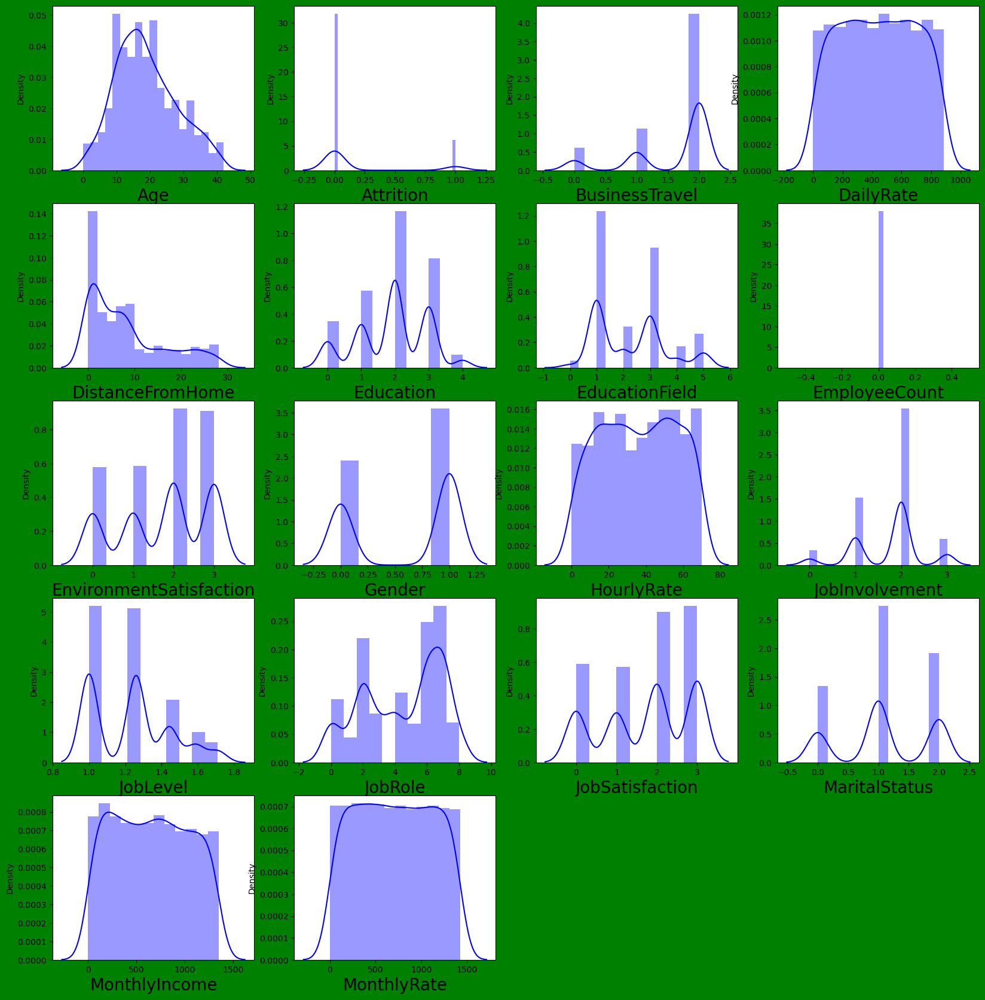

In [408]:
plt.figure(figsize=(20,25),facecolor="green")
plotnumber = 1

for column in df2:
    if plotnumber <= 18:
        ax = plt.subplot(6,4,plotnumber)
        sns.distplot(df2[column],color='b')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()    
        

In [263]:
df2.skew()

Age                         0.413286
Attrition                   1.844366
BusinessTravel             -1.439006
DailyRate                   0.000930
DistanceFromHome            0.958118
Education                  -0.289681
EducationField              0.550371
EmployeeCount               0.000000
EnvironmentSatisfaction    -0.321654
Gender                     -0.408665
HourlyRate                 -0.032311
JobInvolvement             -0.498419
JobLevel                    1.025401
JobRole                    -0.357270
JobSatisfaction            -0.329672
MaritalStatus              -0.152175
MonthlyIncome               0.060816
MonthlyRate                 0.012315
NumCompaniesWorked          1.026471
Over18                      0.000000
OverTime                    0.964489
PercentSalaryHike           0.821128
PerformanceRating           1.921883
RelationshipSatisfaction   -0.302828
StockOptionLevel            0.968980
TotalWorkingYears           1.112899
TrainingTimesLastYear       0.553124
W

if skewness is (-0.5 to +0.5 ), here skewness 1.844 Attrition column so the weight in the left tail of the distribution. The skewness of Business travel -1.439, which indicate that skewness is on the right side. 

Skewness is a statistical term and it is a way to estimate or measure the shape of a distribution. Skewness can be two types:

Skewness = 0: Then normally distributed.
Skewness > 0: Then more weight in the left tail of the distribution.
Skewness < 0: Then more weight in the right tail of the distribution.

Columns to be considered related to Attrition:

Highest negative correlation shows:

1.TotalWorkingYears
2.JobLevel
3.YearsAtCurrentRole
4.MonthlyIncome
5.Age
6.YearsWithCurrManager
7.StockOptionLevel
8.YearsAtCompany
9.JobInvolvement
10.JobSatisfaction
11.EnvironmentSatisfaction

Highest positive correlation:
1.Distance from home
2.NumCompanyWorked
3.Gender
4.MonthlyRate


In [318]:
df2=df1.drop(['Department','EmployeeNumber','StandardHours'],axis=1)


In [319]:
#removing skewness using cuberoot method

df2['Attrition']=np.cbrt(df2['Attrition'])


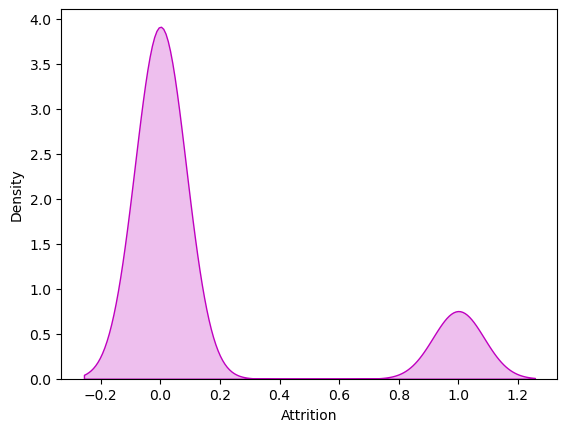

In [320]:
#Let visualize how the data distributed in happiness score after removing skewness

sns.distplot(df2['Attrition'],color = "m",kde_kws = {"shade":True},hist = False)
plt.show()

In [321]:
#removing skewness using cuberoot method

df2['TotalWorkingYears']=np.cbrt(df2['TotalWorkingYears'])
df2['JobLevel']=np.cbrt(df2['JobLevel'])
df2['NumCompaniesWorked']=np.cbrt(df2['NumCompaniesWorked'])
df2['PerformanceRating']=np.cbrt(df2['PerformanceRating'])
df2['TotalWorkingYears']=np.cbrt(df2['TotalWorkingYears'])
df2['YearsAtCompany']=np.cbrt(df2['YearsAtCompany'])
df2['YearsSinceLastPromotion']=np.cbrt(df2['YearsSinceLastPromotion'])

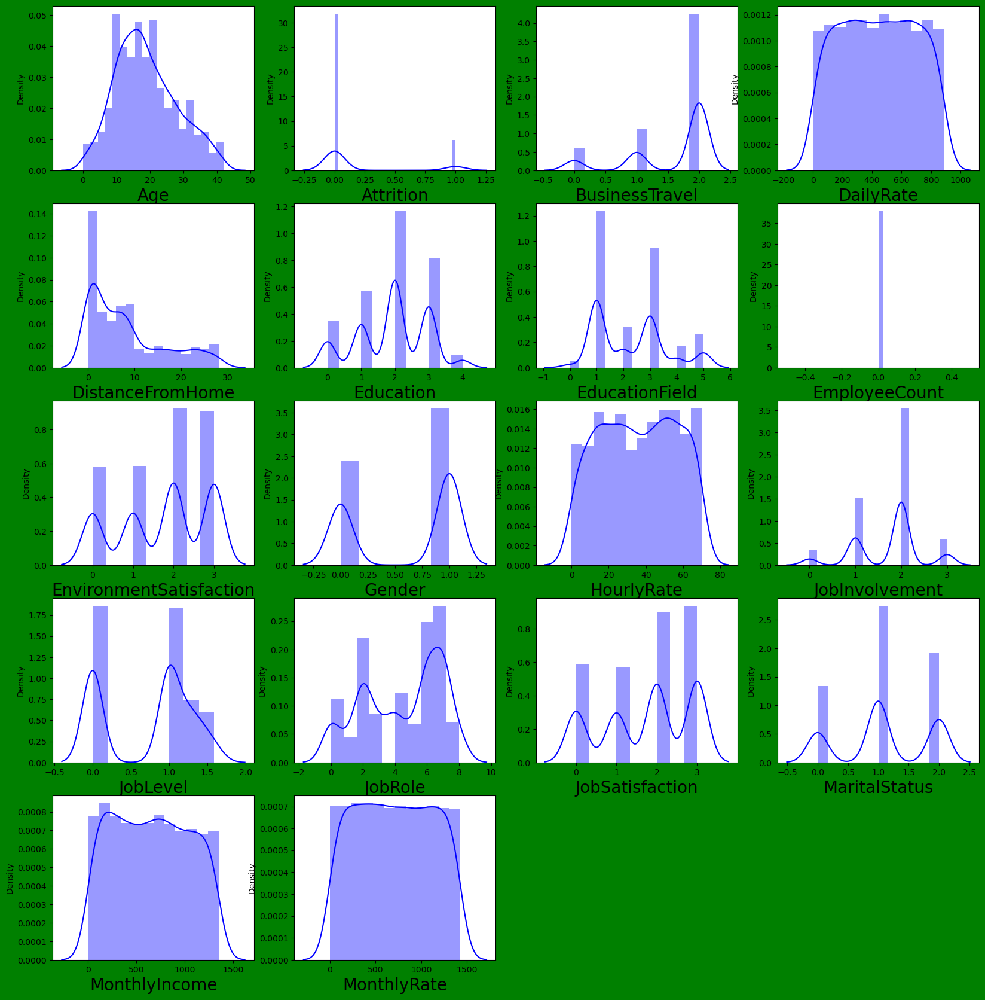

In [267]:
#Rechecking the skewness level in the dataframe df2

plt.figure(figsize=(20,25),facecolor="green")
plotnumber = 1

for column in df2:
    if plotnumber <= 18:
        ax = plt.subplot(6,4,plotnumber)
        sns.distplot(df2[column],color='b')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()    
        

## Correlation level between target variable and independent variables

In [322]:
df2.corr()['Attrition'].sort_values()

TotalWorkingYears          -0.206991
YearsAtCompany             -0.190852
JobLevel                   -0.186106
YearsInCurrentRole         -0.160545
MonthlyIncome              -0.159840
Age                        -0.159205
YearsWithCurrManager       -0.156199
StockOptionLevel           -0.137145
JobInvolvement             -0.130016
JobSatisfaction            -0.103481
EnvironmentSatisfaction    -0.103369
WorkLifeBalance            -0.063939
TrainingTimesLastYear      -0.059478
DailyRate                  -0.056652
YearsSinceLastPromotion    -0.055223
RelationshipSatisfaction   -0.045872
Education                  -0.031373
PercentSalaryHike          -0.013478
HourlyRate                 -0.006846
BusinessTravel              0.000074
PerformanceRating           0.002889
MonthlyRate                 0.015170
Gender                      0.029453
NumCompaniesWorked          0.044984
DistanceFromHome            0.077924
Attrition                   1.000000
EmployeeCount                    NaN
N

In [330]:
new_df=df2
new_df

,Age,Attrition,BusinessTravel,DailyRate,DistanceFromHome,Education,EducationField,EmployeeCount,EnvironmentSatisfaction,Gender,...,PerformanceRating,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,23.0,1.0,2.0,624.0,0.0,1.0,1.0,0.0,1.0,0.0,...,1.442250,0.0,0.0,1.259921,0.0,0.0,1.817121,4.0,0.000000,5.0
1,31.0,0.0,1.0,113.0,7.0,0.0,1.0,0.0,2.0,1.0,...,1.587401,3.0,1.0,1.291550,3.0,2.0,2.154435,7.0,1.000000,7.0
2,19.0,1.0,2.0,805.0,1.0,1.0,4.0,0.0,3.0,1.0,...,1.442250,1.0,0.0,1.241366,3.0,2.0,0.000000,0.0,0.000000,0.0
3,15.0,0.0,1.0,820.0,2.0,3.0,1.0,0.0,3.0,0.0,...,1.442250,2.0,0.0,1.259921,3.0,2.0,2.000000,7.0,1.442250,0.0
4,9.0,0.0,2.0,312.0,1.0,0.0,3.0,0.0,0.0,1.0,...,1.442250,3.0,1.0,1.220285,3.0,2.0,1.259921,2.0,1.259921,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,18.0,0.0,1.0,494.0,22.0,1.0,3.0,0.0,2.0,1.0,...,1.442250,2.0,1.0,1.369987,3.0,2.0,1.709976,2.0,0.000000,3.0
1466,21.0,0.0,2.0,327.0,5.0,0.0,3.0,0.0,3.0,1.0,...,1.442250,0.0,1.0,1.276518,5.0,2.0,1.912931,7.0,1.000000,7.0
1467,9.0,0.0,2.0,39.0,3.0,2.0,1.0,0.0,1.0,1.0,...,1.587401,1.0,1.0,1.220285,0.0,2.0,1.817121,2.0,0.000000,3.0
1468,31.0,0.0,1.0,579.0,1.0,2.0,3.0,0.0,3.0,1.0,...,1.442250,3.0,0.0,1.369987,3.0,1.0,2.080084,6.0,0.000000,8.0


## Seperating features and label

In [331]:
x = new_df.drop("Attrition",axis=1)
y = new_df['Attrition'].astype(int)


In [332]:
#Seperating the independent and target variables into x and y

x = new_df.drop(["Attrition","BusinessTravel","Over18","HourlyRate","PerformanceRating","Education","PercentSalaryHike","MonthlyRate","EmployeeCount"],axis=1)
y = new_df['Attrition'].astype(int)


In [333]:
print("Feature Dimension",x.shape)
print("Label Dimension",y.shape)

Feature Dimension (1470, 23)
Label Dimension (1470,)


In [305]:
x=df2.drop(["RelationshipSatisfaction","EducationField"],axis=1)

## Feature Scaling using Standard Scalarization

In [334]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x),columns =x.columns)
x

,Age,DailyRate,DistanceFromHome,EducationField,EnvironmentSatisfaction,Gender,JobInvolvement,JobLevel,JobRole,JobSatisfaction,...,OverTime,RelationshipSatisfaction,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
0,0.446350,0.713914,-1.010909,-0.937414,-0.660531,-1.224745,0.379672,0.112332,1.032716,1.153254,...,1.591746,-1.584178,-0.932014,-0.048494,-2.171982,-2.493820,0.127705,-0.063296,-1.110010,0.245834
1,1.322365,-1.302446,-0.147150,-0.937414,0.254625,0.816497,-1.026167,0.112332,0.626374,-0.660853,...,-0.628241,1.191438,0.241988,0.154912,0.155707,0.338096,0.703698,0.764998,0.198021,0.806541
2,0.008343,1.428124,-0.887515,1.316673,1.169781,0.816497,-1.026167,-1.092520,-0.998992,0.246200,...,1.591746,-0.658973,-0.932014,-0.167823,0.155707,0.338096,-2.975183,-1.167687,-1.110010,-1.155935
3,-0.429664,1.487313,-0.764121,-0.937414,1.169781,-1.224745,0.379672,-1.092520,0.626374,0.246200,...,1.591746,0.266233,-0.932014,-0.048494,0.155707,0.338096,0.439987,0.764998,0.776497,-1.155935
4,-1.086676,-0.517210,-0.887515,0.565311,-1.575686,0.816497,0.379672,-1.092520,-0.998992,-0.660853,...,-0.628241,1.191438,0.241988,-0.303396,0.155707,0.338096,-0.823761,-0.615492,0.538006,-0.595227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,-0.101159,0.200946,1.703764,0.565311,0.254625,0.816497,1.785511,0.112332,-0.998992,1.153254,...,-0.628241,0.266233,0.241988,0.659348,0.155707,0.338096,-0.055254,-0.615492,-1.110010,-0.314873
1466,0.227347,-0.458021,-0.393938,0.565311,1.169781,0.816497,-1.026167,0.957508,-1.811675,-1.567907,...,-0.628241,-1.584178,0.241988,0.058242,1.707500,0.338096,0.291310,0.764998,0.198021,0.806541
1467,-1.086676,-1.594443,-0.640727,-0.937414,-0.660531,0.816497,1.785511,0.112332,-0.186309,-0.660853,...,1.591746,-0.658973,0.241988,-0.303396,-2.171982,0.338096,0.127705,-0.615492,-1.110010,-0.314873
1468,1.322365,0.536349,-0.887515,0.565311,1.169781,0.816497,-1.026167,0.112332,1.032716,-0.660853,...,-0.628241,1.191438,-0.932014,0.659348,0.155707,-1.077862,0.576737,0.488900,-1.110010,1.086895


In [335]:
y.value_counts()

y

0       1
1       0
2       1
3       0
4       0
       ..
1465    0
1466    0
1467    0
1468    0
1469    0
Name: Attrition, Length: 1470, dtype: int32

## Checking Variance Inflation Factor(VIF)


In [336]:
#Finding variance inflaction factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
vif["VIF values"]=[variance_inflation_factor(x.values,i) for i in range(len(x.columns))]
vif["Features"]=x.columns
vif

,VIF values,Features
0,1.693076,Age
1,1.019859,DailyRate
2,1.007231,DistanceFromHome
3,1.014311,EducationField
4,1.015354,EnvironmentSatisfaction
5,1.017078,Gender
6,1.010902,JobInvolvement
7,6.886684,JobLevel
8,1.031556,JobRole
9,1.016576,JobSatisfaction


VIF is less than 10 we can move on

# Oversampling


In [337]:
#oversampling the data

from imblearn.over_sampling import SMOTE
SM = SMOTE()
X,y = SM.fit_resample(x,y)


In [338]:
y.value_counts()

1    1233
0    1233
Name: Attrition, dtype: int64

## Creating train test split

In [410]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.neighbors import KNeighborsRegressor as KNN


In [411]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier, GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.experimental import enable_hist_gradient_boosting


In [354]:
#finding the best Random state, we are using logistic regression 

maxAcc = 0
maxRS = 0
for i in range(1,1480):
    x_train, x_test, y_train,y_test = train_test_split(X,y,test_size = 0.25, random_state = i)
    lr=LogisticRegression(penalty='l1', solver='liblinear')
    lr.fit(x_train, y_train)
    pred = lr.predict(x_test)
    acc = accuracy_score(y_test,pred)
    if acc > maxAcc:
        maxAcc = acc
        maxRS = i

print("Max r2 score accuracy is ",maxAcc, "at random_state",maxRS)

Max r2 score accuracy is  0.8314424635332253 at random_state 504


# Modeling

# Random Forest Classifier

In [343]:
#Checking accuracy for RandomForestClassifier

RFC = RandomForestClassifier()
RFC.fit(x_train,y_train)
predRFC=RFC.predict(x_test)
print(accuracy_score(y_test,predRFC))
print(confusion_matrix(y_test,predRFC))
print(classification_report(y_test,predRFC))


0.9173419773095624
[[275  22]
 [ 29 291]]
              precision    recall  f1-score   support

           0       0.90      0.93      0.92       297
           1       0.93      0.91      0.92       320

    accuracy                           0.92       617
   macro avg       0.92      0.92      0.92       617
weighted avg       0.92      0.92      0.92       617



# Logistic Regression

In [344]:
LR= LogisticRegression()
LR.fit(x_train, y_train)
predLR = LR.predict(x_test)
print(accuracy_score(y_test,predLR))
print(confusion_matrix(y_test,predLR))
print(classification_report(y_test,predLR))

0.7649918962722853
[[226  71]
 [ 74 246]]
              precision    recall  f1-score   support

           0       0.75      0.76      0.76       297
           1       0.78      0.77      0.77       320

    accuracy                           0.76       617
   macro avg       0.76      0.76      0.76       617
weighted avg       0.77      0.76      0.77       617



# Support Vector Machine Classifier


In [345]:
#Checking accuracy for support vector machine classifier

svc = SVC()
svc.fit(x_train,y_train)
predsvc=svc.predict(x_test)
print(accuracy_score(y_test,predsvc))
print(confusion_matrix(y_test,predsvc))
print(classification_report(y_test,predsvc))

0.8816855753646677
[[250  47]
 [ 26 294]]
              precision    recall  f1-score   support

           0       0.91      0.84      0.87       297
           1       0.86      0.92      0.89       320

    accuracy                           0.88       617
   macro avg       0.88      0.88      0.88       617
weighted avg       0.88      0.88      0.88       617



# Cross Validation Score

Cross-validation is a resampling method that uses different portions of the data to test and train a model on different iterations. It is mainly used in settings where the goal is prediction, and one wants to estimate how accurately a predictive model will perform in practice. 

In [346]:
from sklearn.model_selection import cross_val_score


cv=5--- it's a fold value  1, 2, 3, 4, 5
cross_val_score(modelname, features, targetvariable, cv=foldvalue, scoring='accuracy')


in classification algorithms- default scoring parameter- accuracy
for regression- deafulat scoring parameter is - r2 score


In [377]:
#Checking cv score for Random Forest Classifier

score = cross_val_score(RFC,X,y)

print("Difference between Accuracy score and cross validation score is -", accuracy_score(y_test,predRFC)-score.mean())
print('Accuracy_Score:',accuracy_score(y_test,predRFC))
print('MAE:',mean_absolute_error(y_test, predRFC))
print('MSE:',mean_squared_error(y_test, predRFC))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predRFC)))


Difference between Accuracy score and cross validation score is - -0.019459067274123387
Accuracy_Score: 0.9173419773095624
MAE: 0.08265802269043761
MSE: 0.08265802269043761
RMSE: 0.2875030829233621


In [378]:
#Checking cv score for Logistic Regression

LR = LogisticRegression()

score = cross_val_score(LR, X, y, cv=5)
print("Difference between Accuracy score and cross validation score is -", accuracy_score(y_test,predLR)-score.mean())
print('Accuracy_Score:',accuracy_score(y_test,predLR))
print('MAE:',mean_absolute_error(y_test, predLR))
print('MSE:',mean_squared_error(y_test, predLR))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predLR)))

Difference between Accuracy score and cross validation score is - -0.011981274679747633
Accuracy_Score: 0.7649918962722853
MAE: 0.23500810372771475
MSE: 0.23500810372771475
RMSE: 0.48477634402651576


In [384]:
svc=SVC()
svc.fit(x_train,y_train)

# prediction

predsvc=svc.predict(x_test)
print('Accuracy_Score:',accuracy_score(y_test,predsvc))
print('MAE:',mean_absolute_error(y_test, predsvc))
print('MSE:',mean_squared_error(y_test, predsvc))
print("RMSE:",np.sqrt(mean_squared_error(y_test, predsvc)))


Accuracy_Score: 0.8816855753646677
MAE: 0.11831442463533225
MSE: 0.11831442463533225
RMSE: 0.34396863902881064


Observing the classifiers in our model, Support Vector Machine Classifier is our best model as the difference between accuracy score and cross validation is least. 

# Hyperparameter Tuning
Hyperparameter tuning is the art of finding the best settings for a machine learning model

Hyperparameters are the knobs that control the learning process, such as learning rate, number of layers, or Different hyperparameters can lead to different levels of accuracy, speed, and complexity for the same model and data

In [387]:
from sklearn.model_selection import GridSearchCV


# Create the Random Forest Classifier model
RFC = RandomForestClassifier()

# Define the hyperparameters you want to tune
param_grid = {
    'n_estimators': [100, 200, 300],  
    'max_depth': [None, 10, 20, 30],  
    'min_samples_split': [2, 5, 10],  
    'min_samples_leaf': [1, 2, 4]     
}

# Create the GridSearchCV object with the Random Forest Classifier, the parameter grid, and cross-validation folds (cv)
grid = GridSearchCV(RFC, param_grid, cv=5)


GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]})

In [389]:
# Fitting our GridSearchCV Object
grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=RandomForestClassifier(),
             param_grid={'max_depth': [None, 10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]})

In [390]:
grid.best_params_

{'max_depth': 20,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'n_estimators': 100}

In [392]:
#Create a final model using logistic fit

Final_model =RandomForestClassifier()

Final_model.fit(x_train,y_train)

#predict the target variable using the test data

y_prediction= Final_model.predict(x_test)
y_prediction
acc = accuracy_score(y_test,pred)

print(acc*100)

76.49918962722853


# saving the model


In [393]:
import joblib
joblib.dump(Final_model,"HR_Analytics_model.pkl")

['HR_Analytics_model.pkl']

# Predicting the saved model


In [395]:
#Lets load the saved model and get the prediction

model = joblib.load("HR_Analytics_model.pkl")

#Prediction
y_prediction = model.predict(x_test)



In [396]:
a= np.array(y_test)
df=pd.DataFrame()
df["Predicted"]=y_prediction
df["Original"]=a
df

,Predicted,Original
0,1,1
1,0,0
2,1,1
3,1,1
4,0,0
...,...,...
612,1,0
613,0,0
614,0,0
615,1,1


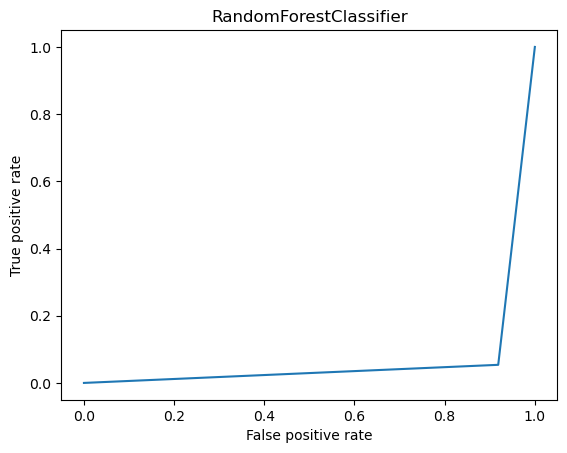

In [398]:
tpr,fpr,thresholds = roc_curve(y_test,y_prediction,pos_label=True)
plt.plot(fpr,tpr,label = 'RandomForestClassifier')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('RandomForestClassifier')
plt.show()


# Final Analysis

In this project, Random Forest Classifier predit the best regression model with the accuracy of 76% hence, this is the best model to evaluate.

Attrition (Target Variable) with Age, JobLevel, TotalWorkingYears is more stronger as compared to other factors.

Accuracy score is stronger than r2 score.


Thank You!